In [5]:

import numpy as np
import pandas as pd 
import torchaudio
import os
import matplotlib.pyplot as plt
import librosa
# from music21 import *
from IPython.display import Audio
import torchaudio.functional as F
import torchaudio.transforms as T
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, Input, ReLU
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from keras import models
!pip install noisereduce
import noisereduce as nr

In [6]:
file_, sr = librosa.load("/kaggle/input/audiogen/ta_in_male/tag_00023_00002135809.wav")

In [7]:
from tqdm import tqdm
data=[]
length=4 # 4 seconds
import glob
for path in tqdm(glob.glob("/kaggle/input/audiogen/ta_in_male/*.wav")):
    file, _ = librosa.core.load(path, sr=sr)
    if len(file) > sr*length:
        data.append(file[:sr*length])
data = np.array(data)

100%|██████████| 1956/1956 [07:33<00:00,  4.32it/s]


In [8]:
def normalization(X):
    mean = X.mean(keepdims=True)
    std = X.std(keepdims=True)
    X = (X - mean) / std
    print("Data Normalized...")
    return X

def rescale(X, rangeMin=-1, rangeMax=+1):
    maxi = X.max()
    mini = X.min()
    X = np.interp(X, (mini, maxi), (rangeMin, rangeMax))
    print("Data Rescaled...")
    return X

x_train = normalization(data)
x_train = rescale(x_train)

Data Normalized...
Data Rescaled...


In [9]:
dims_number = 200

In [10]:
def create_generator():
    
    generator = Sequential()
    generator.add(Dense(units = 1024, input_dim = dims_number))
    generator.add(ReLU())
    
    generator.add(Dense(units = 1024))
    generator.add(ReLU())
    
    generator.add(Dense(units = 2048))
    generator.add(ReLU())
    
    generator.add(Dense(units = 2048))
    generator.add(ReLU())
    
    generator.add(Dense(units = x_train.shape[1]))
    
    generator.compile(loss ="binary_crossentropy",
                     optimizer = Adam(lr = 0.000001, beta_1 = 0.5))
    
    return generator

g = create_generator()
g.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1024)              205824    
_________________________________________________________________
re_lu (ReLU)                 (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
re_lu_1 (ReLU)               (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 2048)              2099200   
_________________________________________________________________
re_lu_2 (ReLU)               (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 2048)              4

2023-02-12 02:20:56.500888: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-12 02:20:56.502093: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-12 02:20:56.502800: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-12 02:20:56.503816: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In [11]:
def create_discriminator():
    discriminator = Sequential()
    discriminator.add(Dense(units = 2048,input_dim = x_train.shape[1])) 
    discriminator.add(ReLU())
    discriminator.add(Dropout(0.4))
    
    discriminator.add(Dense(units = 1024)) 
    discriminator.add(ReLU())
    discriminator.add(Dropout(0.4))
    
    discriminator.add(Dense(units = 512)) 
    discriminator.add(ReLU())
    
    discriminator.add(Dense(units = 1, activation = "sigmoid"))
    
    discriminator.compile(loss = "binary_crossentropy",
                         optimizer = Adam(lr = 0.0001, beta_1 = 0.5))
    return discriminator

d = create_discriminator()
d.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 2048)              180635648 
_________________________________________________________________
re_lu_4 (ReLU)               (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
re_lu_5 (ReLU)               (None, 1024)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 512)              

In [12]:
def create_gan(discriminator, generator):
    discriminator.trainable = False
    gan_input = Input(shape=(dims_number,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(inputs = gan_input, outputs = gan_output)
    gan.compile(loss = "binary_crossentropy", optimizer = "adam")
    return gan

gan = create_gan(d,g)
gan.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200)]             0         
_________________________________________________________________
sequential (Sequential)      (None, 88200)             188272776 
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 183259137 
Total params: 371,531,913
Trainable params: 188,272,776
Non-trainable params: 183,259,137
_________________________________________________________________


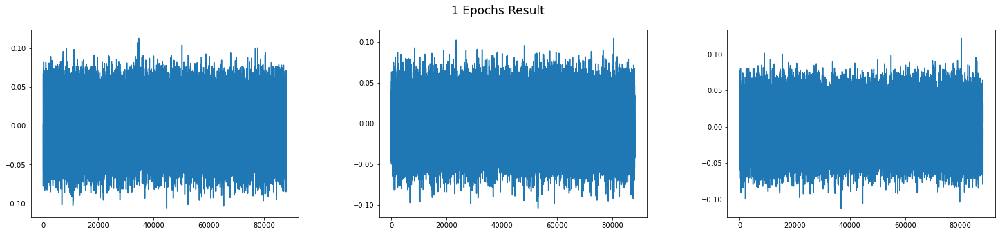

In [14]:
import numpy as np
from scipy.signal import lfilter
from scipy import signal
import IPython
import IPython.display as ipd

def show_gen_samples(epochs, samples = 3):
    samplePlot = []
    fig        = plt.figure(figsize = (1, samples))
    noise      = np.random.normal(0, 1, (samples,dims_number))
    audios     = g.predict(noise)     
    cutoff = 500


    for i, audio in enumerate(audios):
        IPython.display.display(ipd.Audio(data = audio, rate = sr))
        samplePlot.append(fig.add_subplot(1, samples, i+1))
        samplePlot[i].plot(audio.flatten(), '-', )
    plt.gcf().set_size_inches(25, 5)
    plt.subplots_adjust(wspace=0.3,hspace=0.3)
    fig.suptitle("{} Epochs Result".format(epochs), fontsize = 17)
    plt.show()
    
show_gen_samples(1)

epochs:  0
Time since start: 0.0


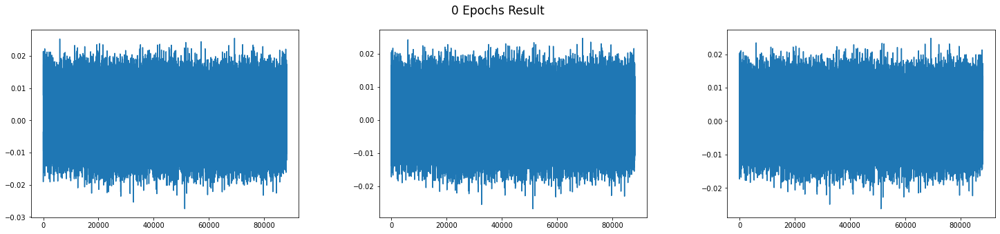

epochs:  2
epochs:  4
epochs:  6
epochs:  8
epochs:  10
Time since start: 23.0


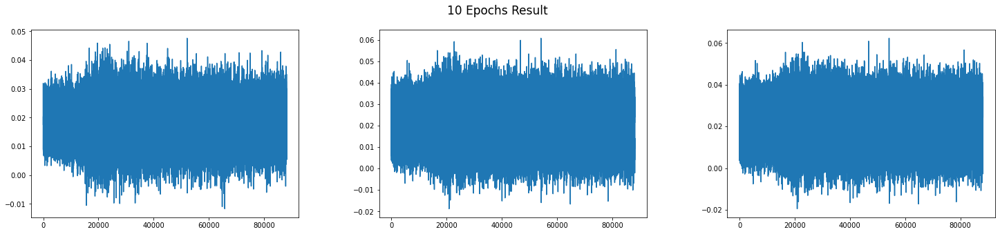

epochs:  12
epochs:  14
epochs:  16
epochs:  18
epochs:  20
Time since start: 45.0


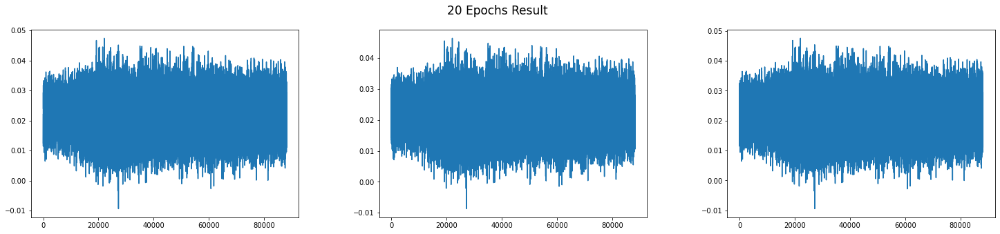

epochs:  22
epochs:  24
epochs:  26
epochs:  28
epochs:  30
Time since start: 67.0


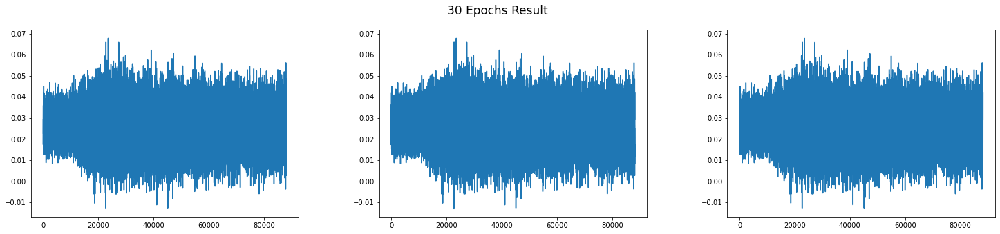

epochs:  32
epochs:  34
epochs:  36
epochs:  38
epochs:  40
Time since start: 89.0


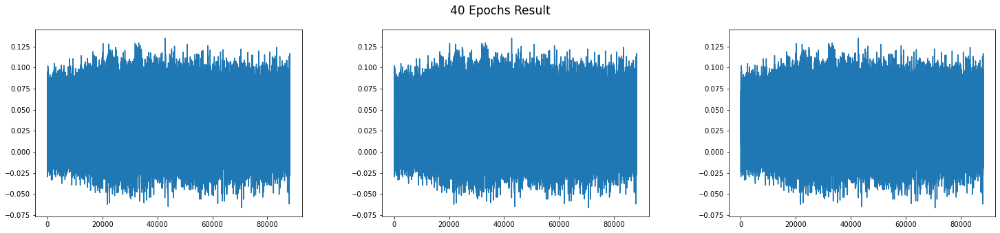

epochs:  42
epochs:  44
epochs:  46
epochs:  48
epochs:  50
Time since start: 110.0


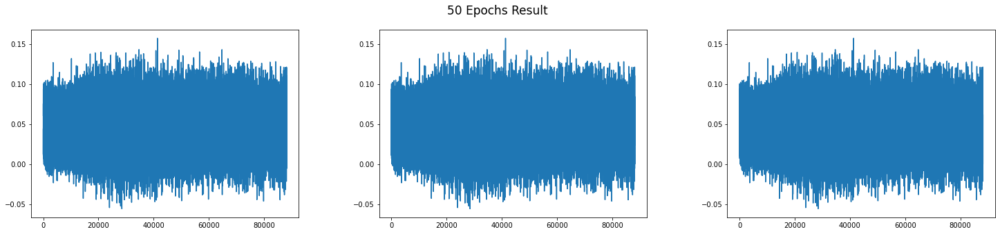

epochs:  52
epochs:  54
epochs:  56
epochs:  58
epochs:  60
Time since start: 130.0


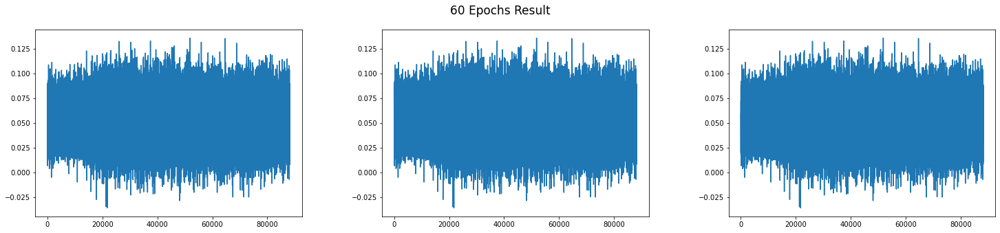

epochs:  62
epochs:  64
epochs:  66
epochs:  68
epochs:  70
Time since start: 151.0


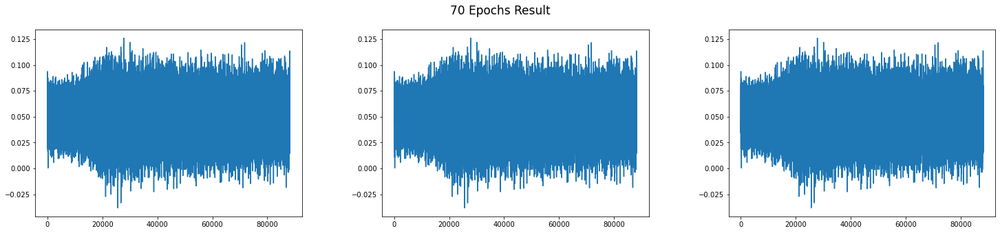

epochs:  72
epochs:  74
epochs:  76
epochs:  78
epochs:  80
Time since start: 171.0


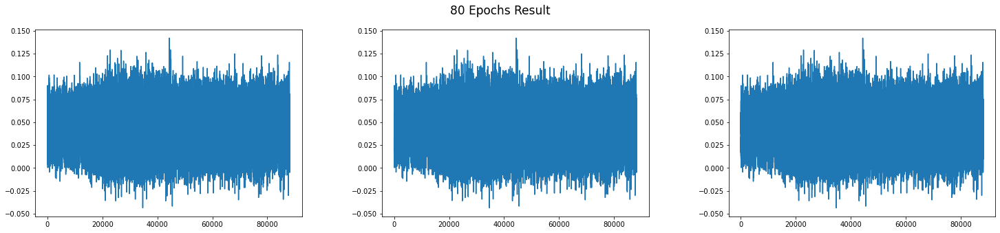

epochs:  82
epochs:  84
epochs:  86
epochs:  88
epochs:  90
Time since start: 191.0


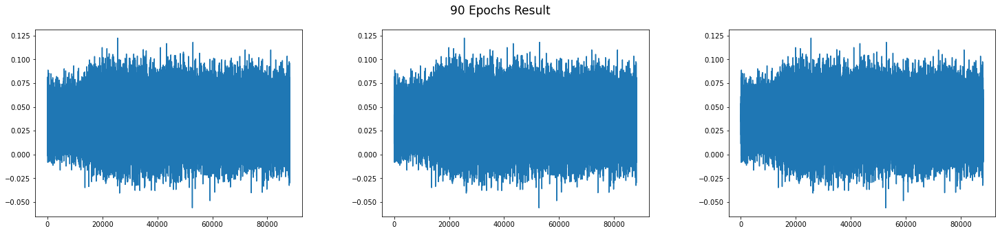

epochs:  92
epochs:  94
epochs:  96
epochs:  98
epochs:  100
Time since start: 212.0


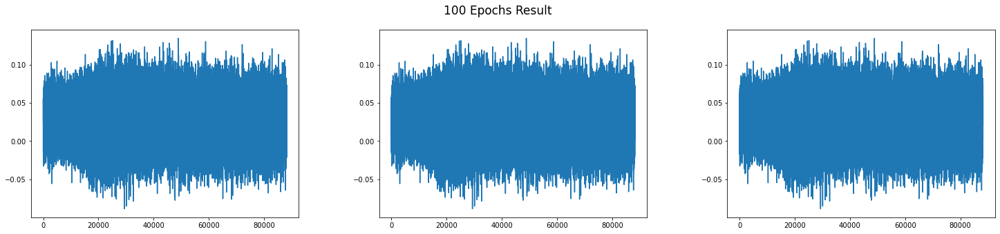

epochs:  102
epochs:  104
epochs:  106
epochs:  108
epochs:  110
Time since start: 233.0


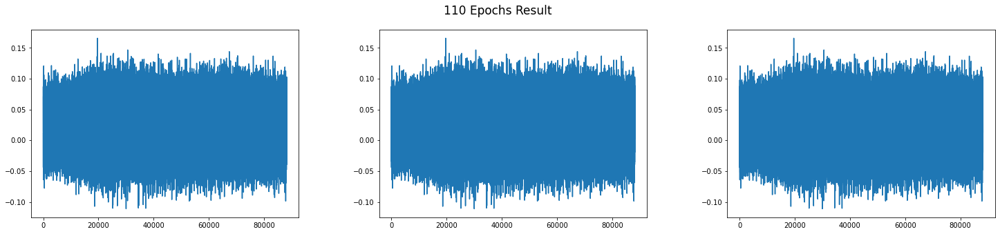

epochs:  112
epochs:  114
epochs:  116
epochs:  118
epochs:  120
Time since start: 253.0


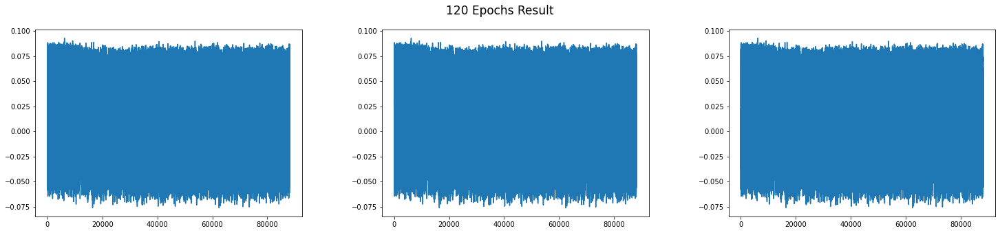

epochs:  122
epochs:  124
epochs:  126
epochs:  128
epochs:  130
Time since start: 274.0


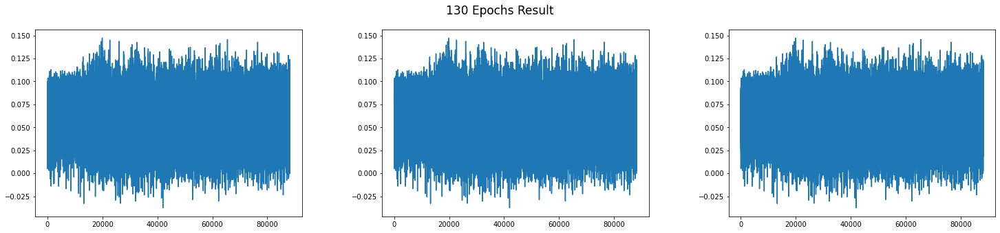

epochs:  132
epochs:  134
epochs:  136
epochs:  138
epochs:  140
Time since start: 294.0


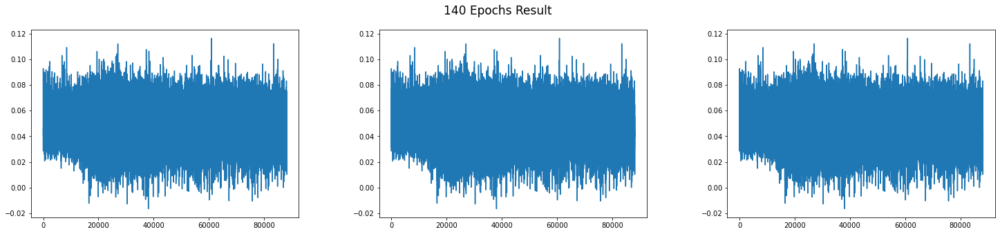

epochs:  142
epochs:  144
epochs:  146
epochs:  148
epochs:  149
Time since start: 313.0
Training Complete.


In [16]:
import time
import IPython
import IPython.display as ipd

D_loss = []
G_loss = []
epochs = 150 
batch_size = 16
current_time = time.time()

for e in range(epochs):
    start_time = time.time()
    for _ in range(batch_size):
        # I reccomend you to look "Training Diagram" (at the top) 
        noise = np.random.normal(0,1, [batch_size,dims_number])
        
        generated_audio = g.predict(noise)
       
        audio_batch = x_train[np.random.randint(low = 0, high = x_train.shape[0], size = batch_size)] #get samples from real data
        
        x = np.concatenate([audio_batch, generated_audio])
        
        y_dis = np.zeros(batch_size*2) 
        y_dis[:batch_size] = 1 
        
        d.trainable = True
        d_loss = d.train_on_batch(x,y_dis) 
        
        noise = np.random.normal(0,1,[batch_size,dims_number])
        
        y_gen = np.ones(batch_size) 
        
        d.trainable = False
        
        g_loss = gan.train_on_batch(noise, y_gen) #train_on_batch
        
        D_loss.append(d_loss)
        G_loss.append(g_loss)
        
    if (e%2 == 0) or (e == epochs-1) :
        print("epochs: ",e)
    if e == epochs-1:
        print("Time since start: {}".format(np.round(start_time - current_time)))
        print("Training Complete.")
    
    # printing results
    if e%10 == 0:
        print("Time since start: {}".format(np.round(start_time - current_time)))
        show_gen_samples(e)

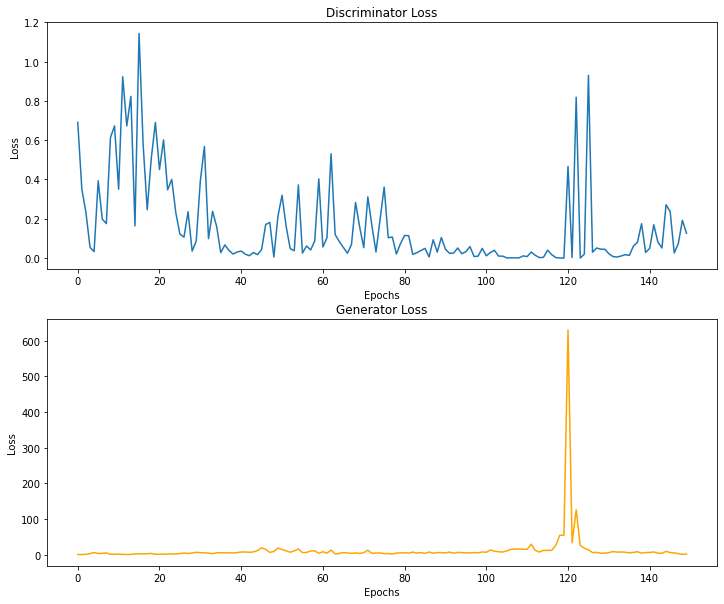

In [17]:
index = 0
D_loss2 = []
G_loss2 = []

for i in range(1,epochs+1):
    D_loss2.append(D_loss[index])
    G_loss2.append(G_loss[index])
    index += batch_size

fig, axs = plt.subplots(2, 1, figsize = (12,10))

axs[0].plot(D_loss2, label = "Discriminator Loss")
axs[1].plot(G_loss2, label = "Generator Loss", color = "orange")

axs[0].set_xlabel("Epochs")
axs[1].set_xlabel("Epochs")

axs[0].set_ylabel("Loss")
axs[1].set_ylabel("Loss")

axs[0].set_title("Discriminator Loss")
axs[1].set_title("Generator Loss")
plt.show()